# 何をしたか

t-SNEという次元圧縮方法を用いてキルミーベイベーの画像を二次元空間上にプロットしてみました。  
PCAなどの既存手法と比べて、非線形な関係を上手く表せた事が確認出来ました。  
複数のハイパーパラメータを試す事で、プロット結果が大きく変わりました。

# 動機

最近t-SNEという単語をよく耳にするので調べてみました。  
どうやら高次元空間上にある非線形な関係を上手く可視化してくれるアルゴリズムらしいです。  
高次元空間上に非線形な関係を持っていそうで、かつ個々の特徴量がきちっとスケーリングされているデータといえば画像データが挙げられます。  
ただMNISTをマッピングするのもつまらないので、キルミーベイベーの公式サイトにあるアイコン画像686枚をプロットしてみます。  

# t-SNEとは

ざっくりいうと、t-SNEとはデータが高次元(多次元)正規分布から発生していると仮定し、その確率分布を低次元(2次元や3次元)なt分布で近似する事で、元のデータの次元を削減する手法です。  
理論的な背景に興味がある方は、ALBERTさんのブログ[t-SNE を用いた次元圧縮方法のご紹介](https://blog.albert2005.co.jp/2015/12/02/tsne/)等を参照してみると良いでしょう。  

# 何がすごいの

t-SNEは非線形な関係を捉える事が出来るので、その点において既存の手法に比べて優れています。  
古典的な次元圧縮の手法といえば主成分分析などが挙げられますが、主成分分析は分散が最大化されるように次元の軸を1次元から順に引き直し、個々の軸の目盛りでデータの関係性を表します。そのため、データ間の非線形な関係を捉える事が出来ません。  

# どうやって使うの

scikit-learnにも実装がありますが、[Multicore-TSNE](https://github.com/DmitryUlyanov/Multicore-TSNE)というモジュールが高速でいい感じらしいです。  
実際に使ってみましょう。

# モジュールのインポート

In [ ]:
import requests
from bs4 import BeautifulSoup
import cv2
import pathlib
import numpy as np
from MulticoreTSNE import MulticoreTSNE as TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

%matplotlib inline

# 画像の取得

公式サイトを確認したところ、画像の二次利用について特に制限はありませんでした。

In [4]:
url = "http://killmebaby.tv/special_icon.html"

In [15]:
headers = {'User-Agent':'Mozilla/5.0'}
soup = BeautifulSoup(requests.get(url,headers=headers).content,'lxml')
images = [] # 画像リストの空配列

for img in soup.find_all('img'):
    print(img.get("src"))
    images.append(img.get("src"))

for target in images[8:-1]: # アイコンのpngのみを取得する
    re = requests.get(target)
    with open('../input/' + target.split('/')[-1], 'wb') as f:
        f.write(re.content)

# スクレイピング終了確認
print("画像保存が完了しました。")

images/spacer.gif
images/cate_btm00_a.png
images/cate_btm01_a.png
images/cate_btm02_a.png
images/cate_btm03_a.png
images/cate_btm04_a.png
images/cate_btm05_a.png
images/icon/title.png
http://aka.saintpillia.com/killme/icon/01_001.png
http://aka.saintpillia.com/killme/icon/01_003.png
http://aka.saintpillia.com/killme/icon/01_005.png
http://aka.saintpillia.com/killme/icon/01_006.png
http://aka.saintpillia.com/killme/icon/01_008.png
http://aka.saintpillia.com/killme/icon/01_009.png
http://aka.saintpillia.com/killme/icon/01_011.png
http://aka.saintpillia.com/killme/icon/01_012.png
http://aka.saintpillia.com/killme/icon/01_015.png
http://aka.saintpillia.com/killme/icon/01_017.png
http://aka.saintpillia.com/killme/icon/01_019.png
http://aka.saintpillia.com/killme/icon/01_021.png
http://aka.saintpillia.com/killme/icon/01_022.png
http://aka.saintpillia.com/killme/icon/01_024.png
http://aka.saintpillia.com/killme/icon/01_025.png
http://aka.saintpillia.com/killme/icon/01_026.png
http://aka.saint

# 画像をarrayに変換

OpenCVを使います

In [50]:
path = pathlib.Path('../input').glob('*.png')
path_l = [p for p in path]
kills = np.concatenate([cv2.imread(str(p)).flatten().reshape(1,-1) for p in path_l], axis=0)

# t_SNEで圧縮

perplexityとは分布の複雑性を表すパラメータです。  
原論文では5~50が推奨されています。  

In [129]:
%%time
tsne = TSNE(n_jobs=4, perplexity=20) # 20が一番いい感じでした
kills_reduced = tsne.fit_transform(kills)

CPU times: user 57.5 s, sys: 3.98 s, total: 1min 1s
Wall time: 16.5 s


# 結果をプロット

In [97]:
def imscatter(x, y, image_list, ax=None, zoom=1):
    if ax is None:
        ax = plt.gca()
    im_list = [OffsetImage(plt.imread(str(p)), zoom=zoom) for p in image_list]
    x, y = np.atleast_1d(x, y)
    artists = []
    for x0, y0, im in zip(x, y, im_list):
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()
    return artists

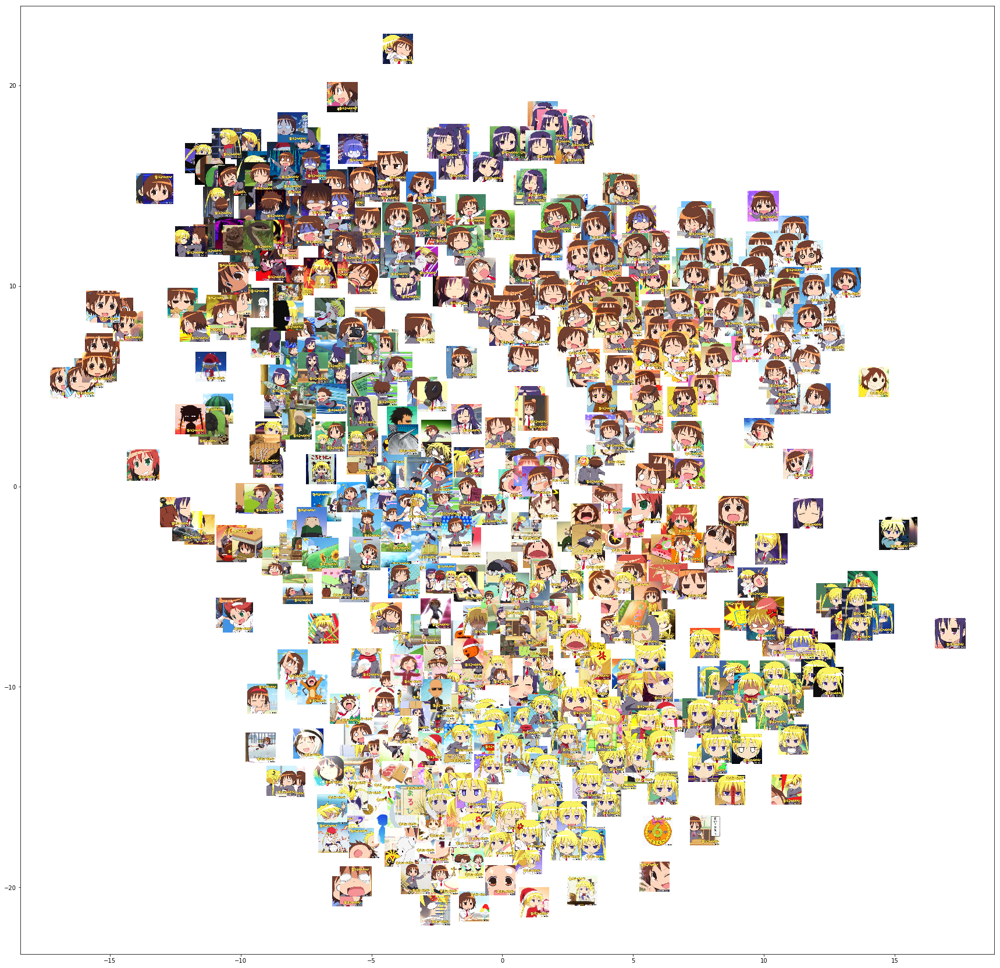

In [115]:
# perplexity: 20
fig, ax = plt.subplots(figsize=(30,30))
imscatter(kills_reduced[:,0], kills_reduced[:,1], path_l, ax=ax, zoom=0.4)

plt.show()

やすな(茶色い髪の子)とソーニャ(黄色い髪の子)とあぎり(紺色の髪の子)が綺麗に分かれている事がわかります。  
キャラで分類するというより画像全体の色味で分類されるようです。  
極めて似た構図(座標(11,3), (11,10)のやすななど)は曲線を描くように表現されるのが印象的です。  

2軸で表現される空間上に多くのクラスターが存在します。  
つまり、画像データ間の非線形な関係が上手く表現されている事がわかります。  
参考までに、PCAを使うと下図のようになります。  

In [132]:
pca = PCA()
kills_pca = pca.fit_transform(kills)

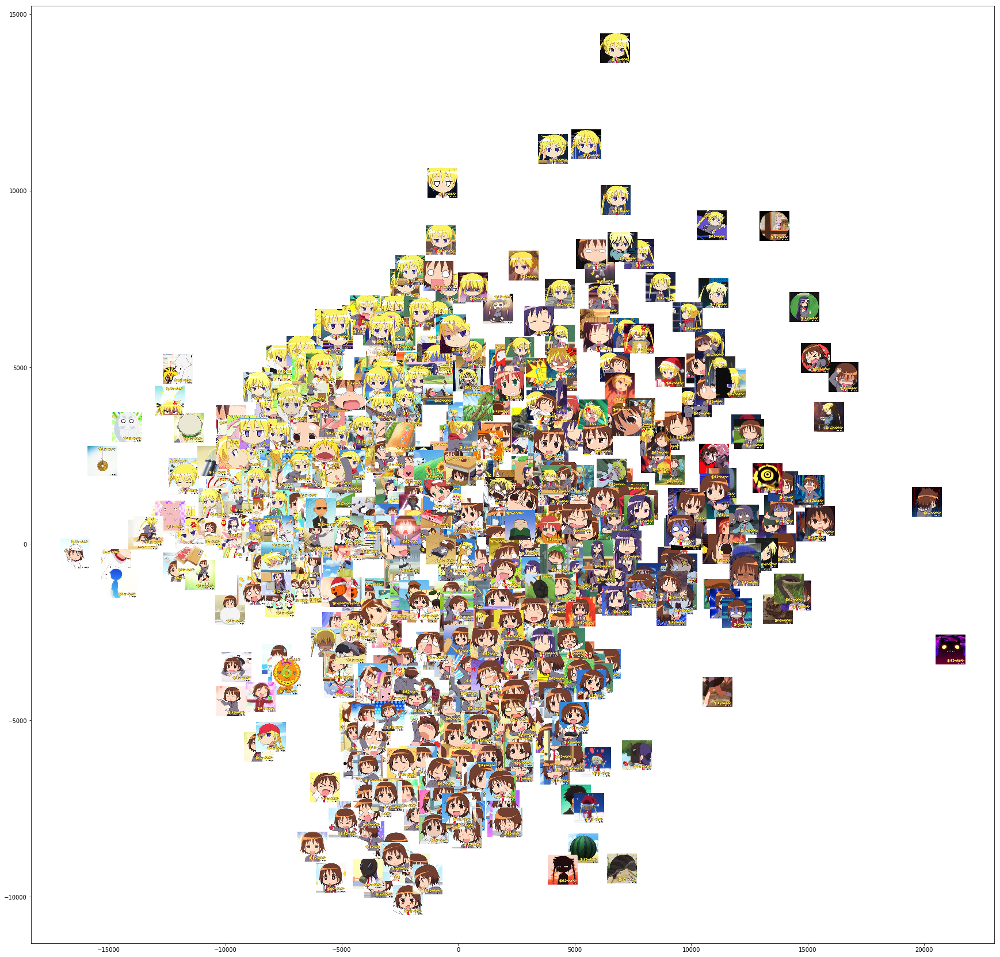

In [134]:
fig, ax = plt.subplots(figsize=(30,30))
imscatter(kills_pca[:,0], kills_pca[:,1], path_l, ax=ax, zoom=0.4)

plt.show()

* X軸: 紺か黄色か  
* Y軸: 茶色かそうでないか  

といったところでしょうか。非線形な関係が上手く表現されていません。

# perplexityを変化させると何が起こるか

perplexityを変化させるとプロットにどのような変化が起こるか試してみます。  

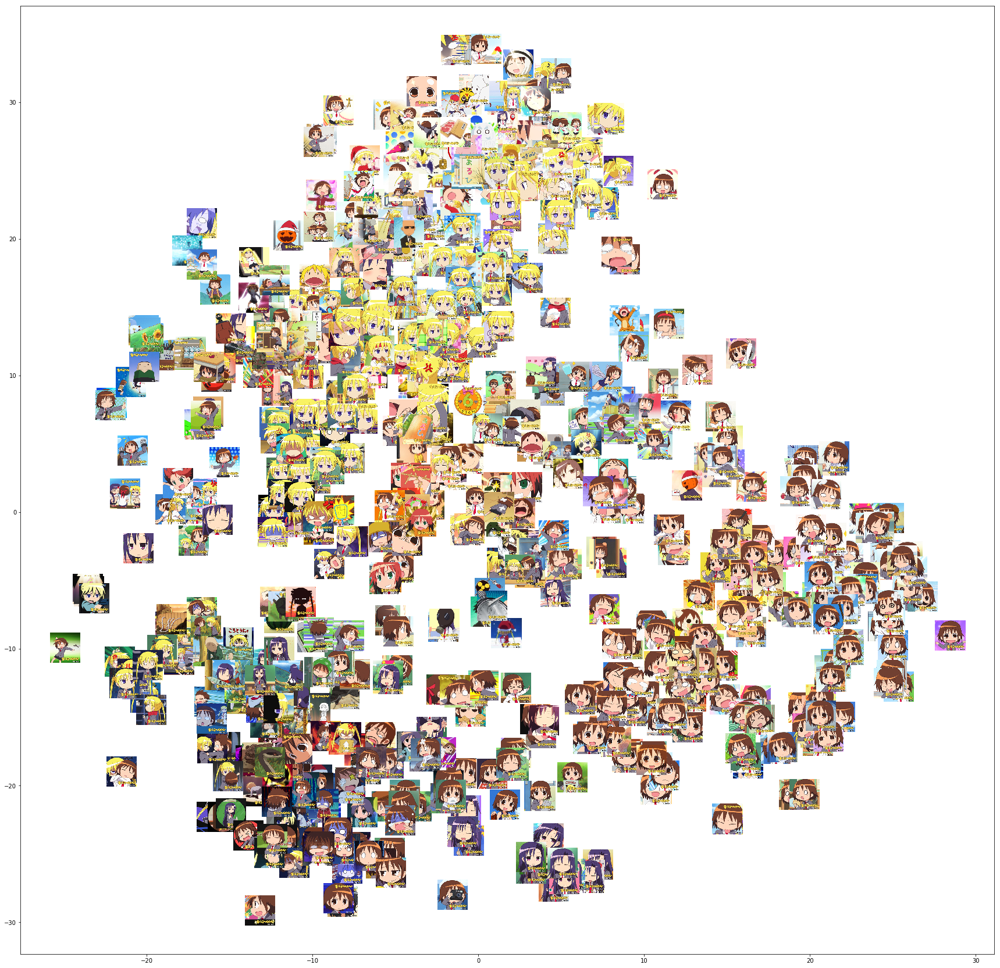

In [124]:
# perplexity: 10
tsne = TSNE(n_jobs=4, perplexity=10)
kills_reduced = tsne.fit_transform(kills)
fig, ax = plt.subplots(figsize=(30,30))
imscatter(kills_reduced[:,0], kills_reduced[:,1], path_l, ax=ax, zoom=0.4)

plt.show()

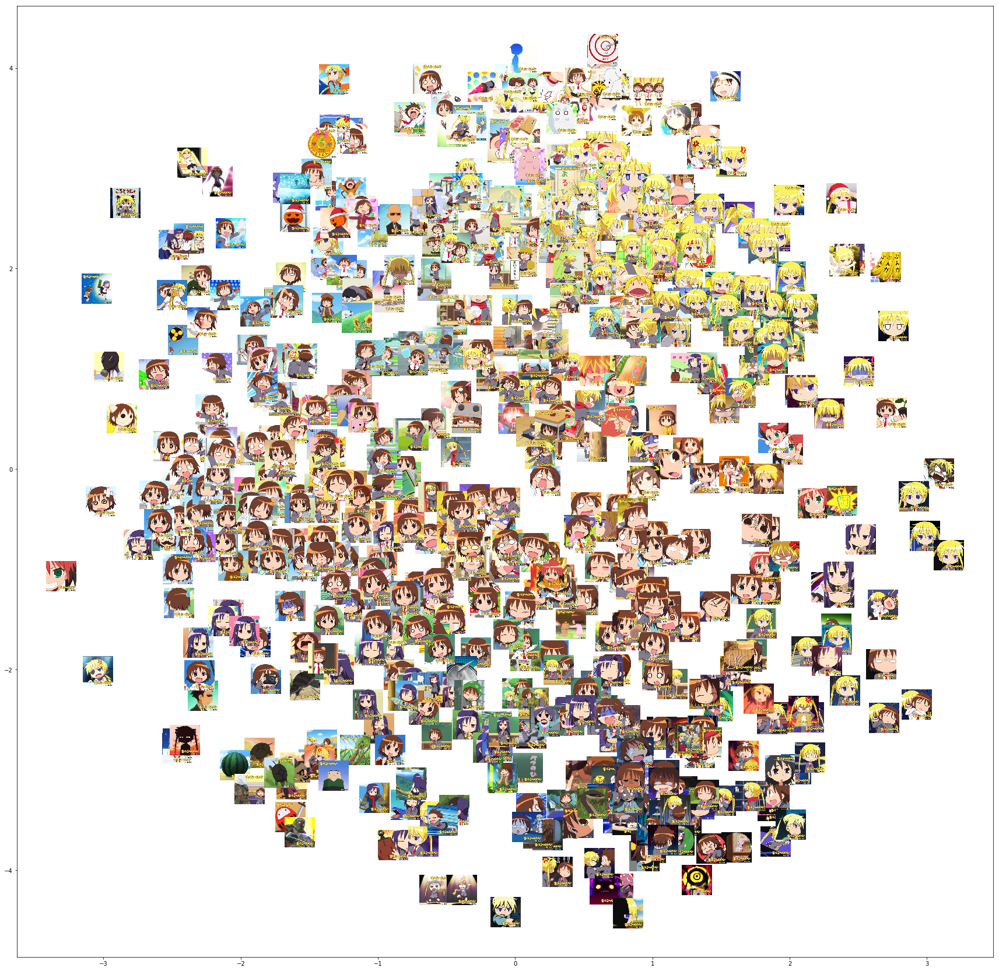

In [130]:
#perplexity: 1000
fig, ax = plt.subplots(figsize=(30,30))
imscatter(kills_reduced[:,0], kills_reduced[:,1], path_l, ax=ax, zoom=0.4)

plt.show()

perplexityを下げると、プロットの凝集度が上がったような気がします。  
逆にperplexityを上げると、画像が満遍なくプロットされるようになりました。 

# t-SNEの応用先

機械学習モデルの特徴量作成に使えなくもなさそうですが、お客さんや上司にプロット結果を見せて「何だかわからないけど凄そうに見せる」という使い方が一番手っ取り早そうです。  
分類問題などにおいて、「どうしてこの特徴量は効くのか/効かないのか」といった説明に説得性を持たせたり、特徴量が多すぎて散布図行列がプロット出来ない場合にサクッと可視化するのもいいでしょう。  
複雑な分類モデルを作る前に、使用する特徴量が本当に使えるのかアタリをつけるのにも使えるかもしれません。  
※個人の感想です

# まとめ

* t-SNEは非線形な関係をもつデータの次元圧縮、可視化が出来るアルゴリズム
* 画像データに適用したところ、既存手法(PCA)と比べてデータの非線形な特徴を上手く表現出来た
* perplexityパラメータは複数の値を試した方が良い
* データの可視化や、分類モデルの特徴量がなぜ効くのか/効かないのかといった説明に説得力を持たせる事ができる